In [ ]:
import numpy as np
import pandas as pd
import scipy
from scipy import stats
from scipy.stats import norm , t

import statsmodels
from statsmodels import stats
from statsmodels.stats import weightstats

import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp as mc
from statsmodels.stats.multicomp import pairwise_tukeyhsd

from statsmodels.stats import proportion
import matplotlib
from matplotlib import pyplot as plt
import pylab
from pylab import plot,legend,xlabel,ylabel,title
import sklearn
from sklearn.model_selection import train_test_split

import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [ ]:
df = pd.read_csv('/content/BankruptcyData.csv',)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [ ]:
df.shape

(6819, 96)

In [ ]:
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


In [ ]:
df.isnull().sum()

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
                                                           ..
 Liability to Equity                                        0
 Degree of Financial Leverage (DFL)                         0
 Interest Coverage Ratio (Interest expense to EBIT)         0
 Net Income Flag                                            0
 Equity to Liability                                        0
Length: 96, dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.head(5)

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [ ]:
df.tail(5)

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009
6818,0,0.493053,0.570105,0.549548,0.627409,0.627409,0.998080,0.801987,0.813800,0.313415,...,0.815956,0.000707,0.626680,0.627408,0.841019,0.275114,0.026793,0.565167,1,0.233902


In [ ]:
df=df.dropna()

In [ ]:
df.count()

Bankrupt?                                                   6819
 ROA(C) before interest and depreciation before interest    6819
 ROA(A) before interest and % after tax                     6819
 ROA(B) before interest and depreciation after tax          6819
 Operating Gross Margin                                     6819
                                                            ... 
 Liability to Equity                                        6819
 Degree of Financial Leverage (DFL)                         6819
 Interest Coverage Ratio (Interest expense to EBIT)         6819
 Net Income Flag                                            6819
 Equity to Liability                                        6819
Length: 96, dtype: int64

<Axes: xlabel=' Net Income to Total Assets'>

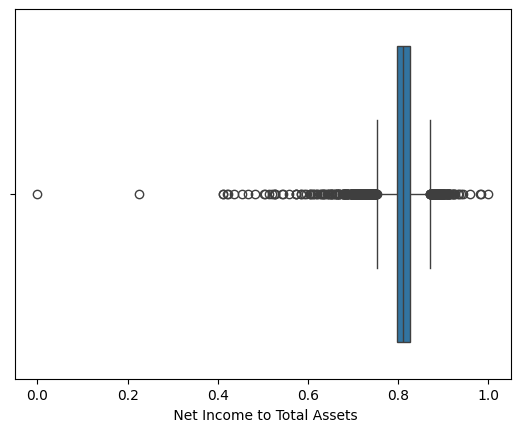

In [ ]:
sns.boxplot(x=df[' Net Income to Total Assets'])

In [ ]:
q1=df[' Net Income to Total Assets'].quantile(0.25)

In [ ]:
q3=df[' Net Income to Total Assets'].quantile(0.75)

In [ ]:
IQR=q3-q1

In [ ]:
df=df[~((df[' Net Income to Total Assets']< (q1 - 1.5 * IQR)) |(df[' Net Income to Total Assets']> (q3 + 1.5 * IQR)))]

<Axes: xlabel=' Net Income to Total Assets'>

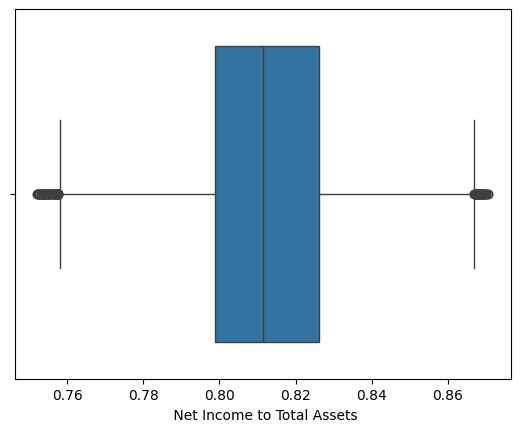

In [ ]:
sns.boxplot(x=df[' Net Income to Total Assets'])

In [ ]:
correlation_matrix = df.corr()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
Bankrupt?,1.000000,-0.150610,-0.149973,-0.153367,-0.053927,-0.053428,0.001491,-0.001876,-0.003491,-0.007432,...,-0.175748,-0.004668,-0.002541,-0.053926,-0.185975,0.151888,0.018155,-0.002209,NaN,-0.059381
ROA(C) before interest and depreciation before interest,-0.150610,1.000000,0.919765,0.983473,0.303907,0.302584,0.035563,0.045401,0.043516,0.004526,...,0.901922,0.010419,0.002738,0.303908,0.717015,-0.166677,-0.029109,0.010428,NaN,0.029116
ROA(A) before interest and % after tax,-0.149973,0.919765,1.000000,0.932313,0.302359,0.300898,0.032576,0.046675,0.045092,0.014408,...,0.984685,0.017890,0.004045,0.302361,0.789427,-0.159046,-0.026035,0.015203,NaN,0.034683
ROA(B) before interest and depreciation after tax,-0.153367,0.983473,0.932313,1.000000,0.313220,0.311869,0.035780,0.046533,0.045088,0.006278,...,0.915468,0.010707,0.001216,0.313221,0.729254,-0.171470,-0.028354,0.011885,NaN,0.035426
Operating Gross Margin,-0.053927,0.303907,0.302359,0.313220,1.000000,0.999631,0.002097,0.027576,0.022939,0.050492,...,0.311315,0.015557,-0.000293,1.000000,0.223093,-0.135704,-0.014018,-0.002723,NaN,0.095846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Liability to Equity,0.151888,-0.166677,-0.159046,-0.171470,-0.135704,-0.135752,0.003892,-0.005909,-0.007383,-0.021446,...,-0.196670,0.029583,-0.024734,-0.135705,-0.483789,1.000000,0.007930,0.007638,NaN,-0.300014
Degree of Financial Leverage (DFL),0.018155,-0.029109,-0.026035,-0.028354,-0.014018,-0.013413,0.000856,0.000643,0.000746,-0.000800,...,-0.029390,-0.000765,-0.009146,-0.014018,-0.019770,0.007930,1.000000,0.016366,NaN,-0.017128
Interest Coverage Ratio (Interest expense to EBIT),-0.002209,0.010428,0.015203,0.011885,-0.002723,-0.002702,0.000354,0.000819,0.000816,0.000787,...,0.014970,0.001261,0.000817,-0.002725,0.019026,0.007638,0.016366,1.000000,NaN,-0.009260
Net Income Flag,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


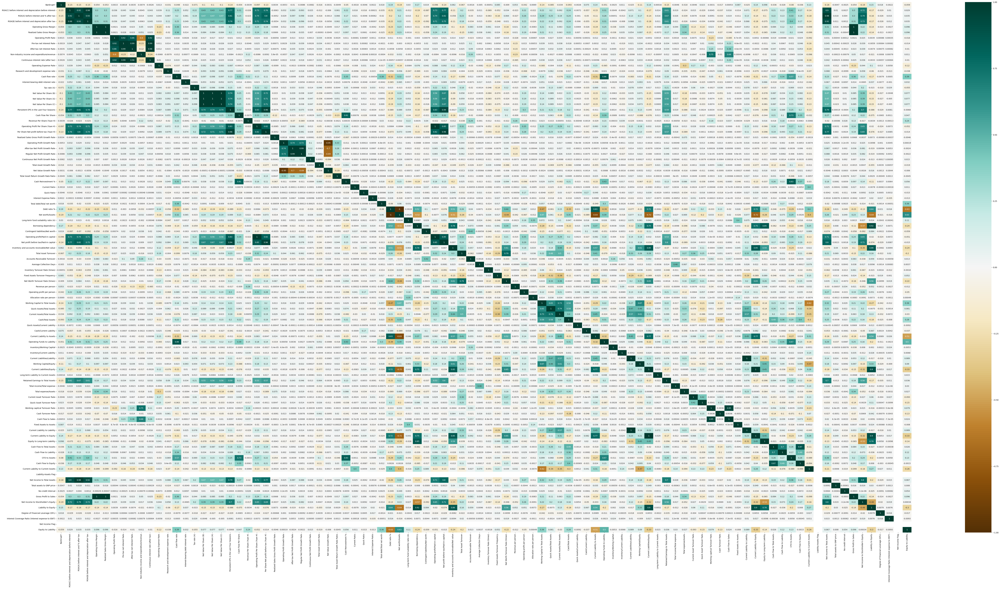

In [ ]:
plt.figure(figsize=(100,50))
corr = df.corr()
sns.heatmap(corr, cmap="BrBG",annot=True)
corr

Bankrupt?                              1.000000
 Debt ratio %                          0.191092
 Borrowing dependency                  0.173949
 Liability to Equity                   0.151888
 Current Liabilities/Equity            0.144094
                                         ...   
 Net Income to Total Assets           -0.175748
 Net Income to Stockholder's Equity   -0.185975
 Net worth/Assets                     -0.191092
 Liability-Assets Flag                      NaN
 Net Income Flag                            NaN
Name: Bankrupt?, Length: 96, dtype: float64


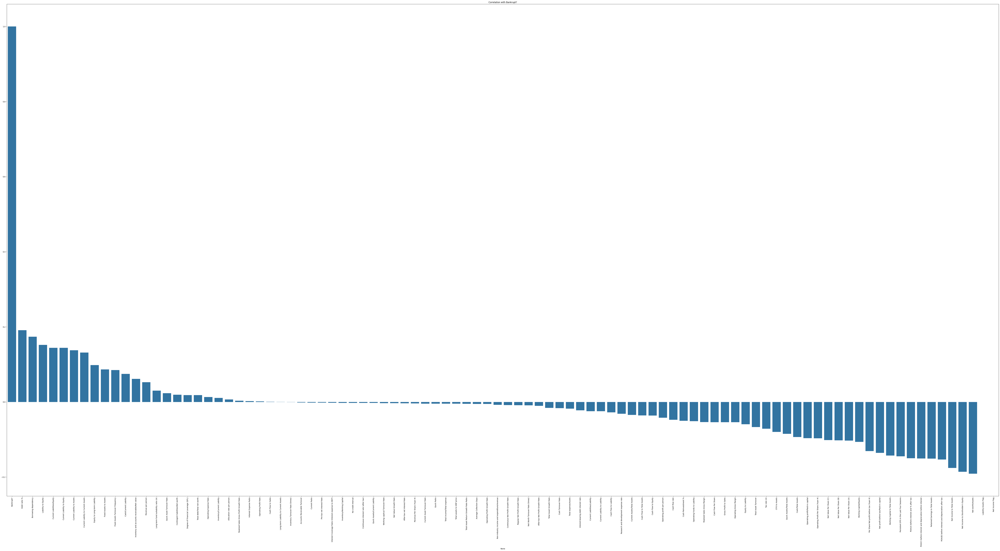

In [ ]:


# Compute the correlation matrix
corr_matrix = df.corr()

# Correlation with the target variable ('Bankrupt?')
corr_with_target = corr_matrix['Bankrupt?'].sort_values(ascending=False)

# Print the correlations
print(corr_with_target)

# Plot the correlations
plt.figure(figsize=(100, 50))
sns.barplot(x=corr_with_target.index, y=corr_with_target.values)
plt.xticks(rotation=90)
plt.title('Correlation with Bankrupt?')
plt.show()

In [ ]:
df1 = df[['Bankrupt?', ' Debt ratio %', ' Net worth/Assets', ' Borrowing dependency']]

In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Bankrupt?              6819 non-null   int64  
 1    Debt ratio %          6819 non-null   float64
 2    Net worth/Assets      6819 non-null   float64
 3    Borrowing dependency  6819 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 213.2 KB


In [ ]:
correlation_matrix = df.corr()

,Bankrupt?,Research and development expense rate,Debt ratio %,Net worth/Assets,Borrowing dependency,Inventory and accounts receivable/Net value,Total income/Total expense,Gross Profit to Sales,Degree of Financial Leverage (DFL)
Bankrupt?,1.000000,-0.031289,0.191092,-0.191092,0.173949,0.061590,-0.004630,-0.053926,0.018155
Research and development expense rate,-0.031289,1.000000,-0.056157,0.056157,-0.069247,-0.058653,-0.009095,-0.019549,-0.015003
Debt ratio %,0.191092,-0.056157,1.000000,-1.000000,0.524477,0.508946,-0.026816,-0.226337,0.020955
Net worth/Assets,-0.191092,0.056157,-1.000000,1.000000,-0.524477,-0.508946,0.026816,0.226337,-0.020955
Borrowing dependency,0.173949,-0.069247,0.524477,-0.524477,1.000000,0.776934,-0.009802,-0.114747,0.016832
Inventory and accounts receivable/Net value,0.061590,-0.058653,0.508946,-0.508946,0.776934,1.000000,-0.011593,-0.101752,-0.008190
Total income/Total expense,-0.004630,-0.009095,-0.026816,0.026816,-0.009802,-0.011593,1.000000,0.044167,-0.001215
Gross Profit to Sales,-0.053926,-0.019549,-0.226337,0.226337,-0.114747,-0.101752,0.044167,1.000000,-0.014018
Degree of Financial Leverage (DFL),0.018155,-0.015003,0.020955,-0.020955,0.016832,-0.008190,-0.001215,-0.014018,1.000000


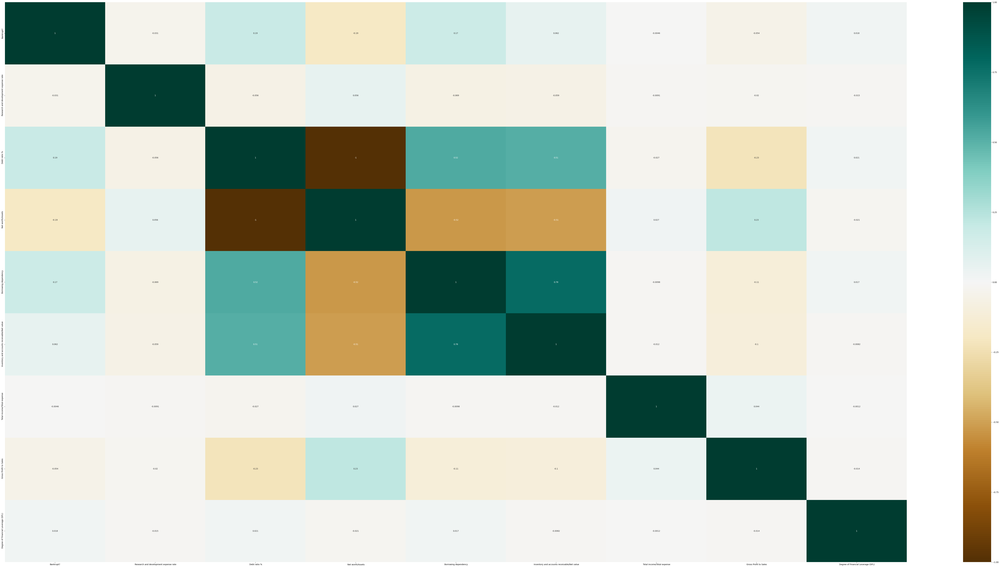

In [ ]:
plt.figure(figsize=(100,50))
corr = df.corr()
sns.heatmap(corr, cmap="BrBG",annot=True)
corr

In [ ]:
df.shape

(6258, 9)

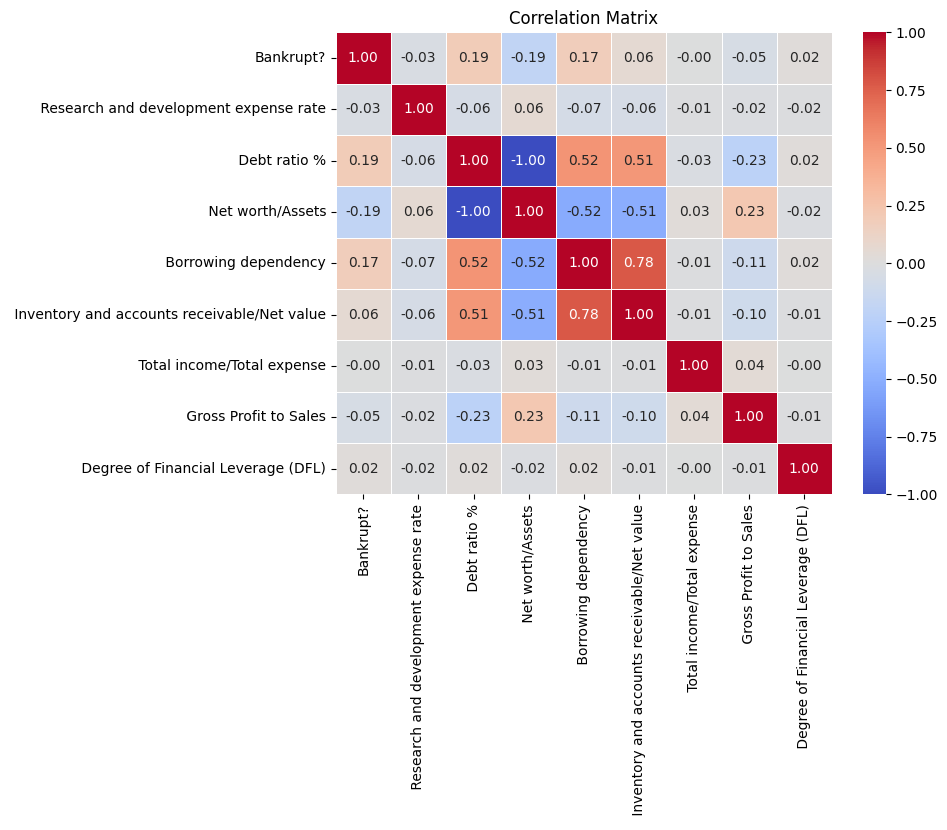

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

In [ ]:
df = df[['Bankrupt?', ' Research and development expense rate', ' Debt ratio %', ' Net worth/Assets', ' Borrowing dependency', ' Inventory and accounts receivable/Net value', ' Total income/Total expense', ' Gross Profit to Sales']]

In [ ]:
correlation_matrix = df.corr()

In [ ]:
import seaborn as sns

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
Bankrupt?,1.000000,-0.260807,-0.282941,-0.273051,-0.100043,-0.099445,-0.000230,-0.008517,-0.008857,-0.016593,...,-0.315457,0.035104,-0.005547,-0.100044,-0.180987,0.166812,0.010508,-0.005509,NaN,-0.083048
ROA(C) before interest and depreciation before interest,-0.260807,1.000000,0.940124,0.986849,0.334719,0.332755,0.035725,0.053419,0.049222,0.020501,...,0.887670,-0.071725,0.008135,0.334721,0.274287,-0.143629,-0.016575,0.010573,NaN,0.052416
ROA(A) before interest and % after tax,-0.282941,0.940124,1.000000,0.955741,0.326969,0.324956,0.032053,0.053518,0.049474,0.029649,...,0.961552,-0.098900,0.011463,0.326971,0.291744,-0.141039,-0.011515,0.013372,NaN,0.057887
ROA(B) before interest and depreciation after tax,-0.273051,0.986849,0.955741,1.000000,0.333749,0.331755,0.035212,0.053726,0.049952,0.022366,...,0.912040,-0.089088,0.007523,0.333750,0.280617,-0.142838,-0.014663,0.011473,NaN,0.056430
Operating Gross Margin,-0.100043,0.334719,0.326969,0.333749,1.000000,0.999518,0.005745,0.032493,0.027175,0.051438,...,0.300143,0.022672,0.004205,1.000000,0.075304,-0.085434,-0.011806,-0.001167,NaN,0.120029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Liability to Equity,0.166812,-0.143629,-0.141039,-0.142838,-0.085434,-0.085407,0.001541,-0.004043,-0.004390,-0.011899,...,-0.159697,0.021982,-0.003724,-0.085434,-0.791836,1.000000,0.002119,0.001487,NaN,-0.159654
Degree of Financial Leverage (DFL),0.010508,-0.016575,-0.011515,-0.014663,-0.011806,-0.011268,0.000935,0.000855,0.000927,-0.000556,...,-0.010463,-0.001881,-0.008812,-0.011806,-0.000093,0.002119,1.000000,0.016513,NaN,-0.016739
Interest Coverage Ratio (Interest expense to EBIT),-0.005509,0.010573,0.013372,0.011473,-0.001167,-0.001158,0.000393,0.000984,0.000957,0.001024,...,0.012746,0.000239,0.001027,-0.001169,0.005147,0.001487,0.016513,1.000000,NaN,-0.008339
Net Income Flag,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


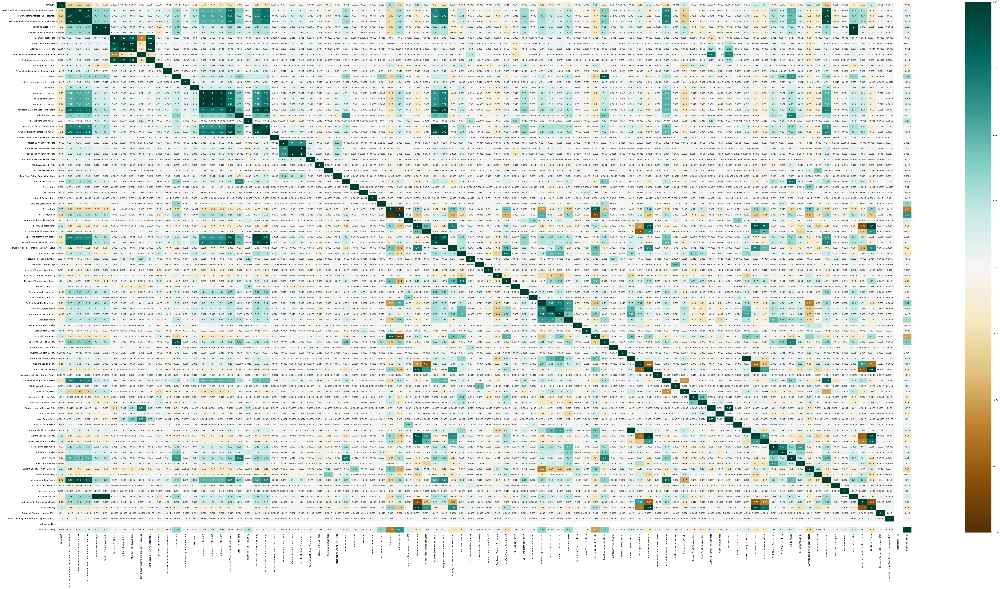

In [ ]:
plt.figure(figsize=(100,50))
corr = df.corr()
sns.heatmap(corr, cmap="BrBG",annot=True)
corr

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [ ]:
df1 = df[['Bankrupt?', ' Debt ratio %', ' Net worth/Assets', ' Borrowing dependency']]

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Bankrupt?              6819 non-null   int64  
 1    Debt ratio %          6819 non-null   float64
 2    Net worth/Assets      6819 non-null   float64
 3    Borrowing dependency  6819 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 213.2 KB


In [ ]:
df1.head(5)

,Bankrupt?,Debt ratio %,Net worth/Assets,Borrowing dependency
0,1,0.207576,0.792424,0.390284
1,1,0.171176,0.828824,0.376760
2,1,0.207516,0.792484,0.379093
3,1,0.151465,0.848535,0.379743
4,1,0.106509,0.893491,0.375025


In [ ]:
df1.tail(5)

,Bankrupt?,Debt ratio %,Net worth/Assets,Borrowing dependency
6814,0,0.124618,0.875382,0.373823
6815,0,0.099253,0.900747,0.372505
6816,0,0.038939,0.961061,0.369637
6817,0,0.086979,0.913021,0.369649
6818,0,0.014149,0.985851,0.370049


In [ ]:
x=df1[[' Debt ratio %', ' Net worth/Assets', ' Borrowing dependency']]


In [ ]:
y=df1['Bankrupt?']

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=1)

In [ ]:
x_train = sm.add_constant(x_train,prepend=False)

In [ ]:
x_test = sm.add_constant(x_test,prepend=False)

In [ ]:
results = sm.Logit(y_train,x_train).fit()

Optimization terminated successfully.
         Current function value: 0.110629
         Iterations 9


In [ ]:
model = LogisticRegression()

In [ ]:
print(results.summary())

                           Logit Regression Results                           
Dep. Variable:              Bankrupt?   No. Observations:                 5455
Model:                          Logit   Df Residuals:                     5451
Method:                           MLE   Df Model:                            3
Date:                Mon, 17 Jun 2024   Pseudo R-squ.:                  0.2028
Time:                        15:35:39   Log-Likelihood:                -603.48
converged:                       True   LL-Null:                       -756.97
Covariance Type:            nonrobust   LLR p-value:                 3.081e-66
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
 Debt ratio %            14.4594        nan        nan        nan         nan         nan
 Net worth/Assets       -11.1595        nan        nan        nan         nan         nan
 Borrowi

In [ ]:
model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)

In [ ]:
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.96


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1314
           1       0.00      0.00      0.00        50

    accuracy                           0.96      1364
   macro avg       0.48      0.50      0.49      1364
weighted avg       0.93      0.96      0.94      1364

